# Library Import

In [4]:
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
import time
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.cluster import cluster_visualizer
from pyclustering.utils import read_sample
from sklearn.metrics.pairwise import pairwise_distances
from scipy.spatial.distance import cdist


In [5]:
pd.set_option('display.max_columns', 999) #display max 999 columns when a dataframe is called

## Data Import

Data obtained through the RFM analysis are imported using Pandas library

In [6]:
data = pd.read_csv('rfm_seg.csv', index_col=0) 


## Data Manipulation 

In [7]:
#rename customer_unique_id to customer_id
data.rename(columns={'customer_unique_id':'customer_id'}, inplace=True)

#check for duplicates
print(data.duplicated().sum()) 


0


There are zero duplicates in our data, now it is time to transform our data bringing them on a scale from 0 to 1 and standardize them with mean zero and standard deviation equal to 1 so that they are exactly on the same range 

In [8]:
#select only the columns we need to use for clustering
df_transformed = data[['recency', 'frequency', 'transaction_value']] 

#Scaling and Normalization of our data
scaler = StandardScaler() # set up scaler
scaler.fit(df_transformed) # fit our data to the scaler
df_norm = scaler.transform(df_transformed) # trasnform data with scaler
df_norm = pd.DataFrame(data=df_norm, index=df_transformed.index, columns=df_transformed.columns) # convert back to dataframe

After the transformation a new dataframe has been created which is df_norm, this will be used for our clustering approach

## Model Preparation - Clustering

Let's now begin to approach to Clustering algorithm, in this case K-Means Clustering was selected. K-Means Clustering is an unsupervised algorithm that is used to explore the dataset and find which observation are more similar to each other. As an itialization method, k-means++ was selected. Since the right number of cluster is unknown in this problem it is better to use some methods sto find the right amount *k*. In this case the elbow method was selected. This method is based on plotting the WCSS vs the number of clusters k on a scree plot, and the right number of cluster is the one correspondent to a lower inflection point, like an elbow

In [9]:
from sklearn.cluster import KMeans
wcss = [] 
for i in range(2, 8): 
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42) #k-means++ as initialization
    kmeans.fit(df_norm) 
    wcss.append(kmeans.inertia_) #we compute wcss (intra-cluster variance)

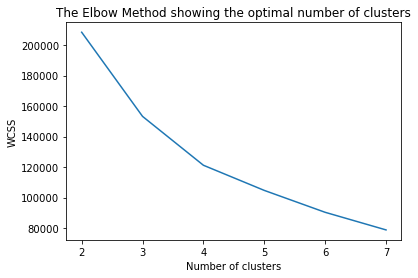

In [10]:
plt.plot(range(2, 8), wcss)
plt.xlabel('Number of clusters')
plt.title ("The Elbow Method showing the optimal number of clusters")
plt.ylabel('WCSS') 
plt.show()

**Four** was selected as the right number of clusters

In [8]:
# Let's see how this clustering looks like
import time
time_start = time.time()
k_means = KMeans(n_clusters=4, random_state=1, init="k-means++")
k_means.fit(df_norm)
print('K-Means done! Time elapsed: {} seconds'.format(time.time()-time_start))
cluster = k_means.labels_
df_rfm_4 = data.assign(Cluster=cluster) #we apply our result to our original dataframe and not to the normalized one
df_group_4 = df_rfm_4.groupby('Cluster') #we groupby Cluster so we can see the clusters

#for each variable we compute the mean
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'transaction_value': ['mean', 'count'],
  }).round(1)


K-Means done! Time elapsed: 1.7644391059875488 seconds


recency frequency transaction_value       
           mean      mean              mean  count
Cluster                                           
0         126.0       1.1           13425.8  50135
1         385.5       1.1           13038.2  37010
2         227.2       3.8           73233.7   3537
3         224.1       8.6          806511.7    108

In [16]:
#we transform the groupby datatype into a Pandas dataframe

clusters=df_group_4.aggregate({'recency': 'mean', 'frequency': 'mean', 'transaction_value': ['mean', 'count']}).round(1)
#assign labels to each cluster
keys_cluster= {0:"Bernacles",1:"Strangers",2:"Loyals",3:"True Friends"}
#assign keys_cluster to each cluster
for i in range(len(clusters)):
    clusters.loc[i,'Cluster']=keys_cluster[i]



In [18]:
clusters

recency frequency transaction_value              Cluster
           mean      mean              mean  count              
Cluster                                                         
0         126.0       1.1           13425.8  50135     Bernacles
1         385.5       1.1           13038.2  37010     Strangers
2         227.2       3.8           73233.7   3537        Loyals
3         224.1       8.6          806511.7    108  True Friends

## Data Visualization

For what regards data visualization, three pie charts are plotted showing the distribution of the various values associated with each cluster.


In [19]:
# colors are associated to labels in a one by one relationship
labels = ["Bernacles","Strangers","Loyals","True Friends"]
colors = ['#34c1bb','#d54240','#7135aa','#ffa300']


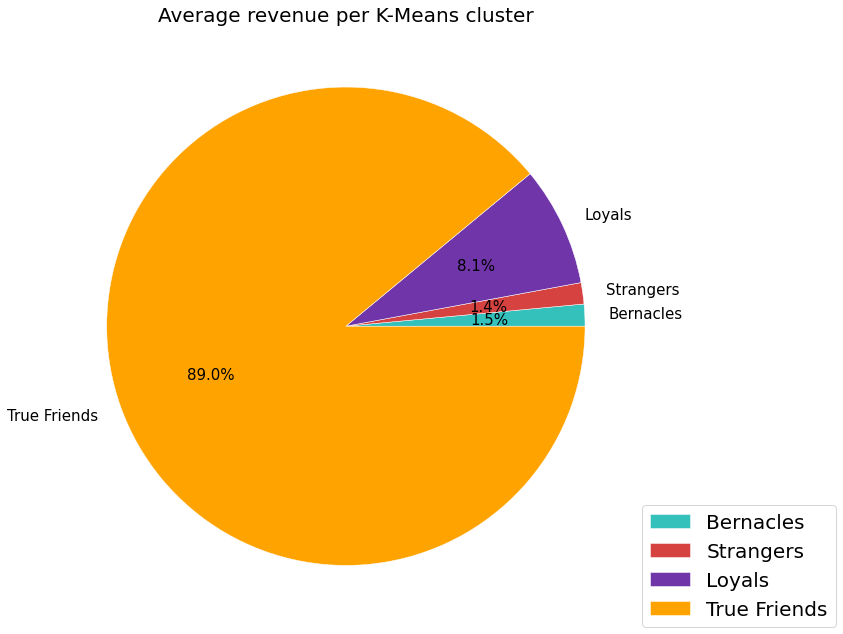

In [22]:
plt.figure(figsize=(23,11))
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'transaction_value': ['mean', 'count']
  }).round(1)['transaction_value', 'mean'].plot(kind='pie',autopct='%1.1f%%',labels=labels, ylabel='', 
  wedgeprops={'linewidth': 0.5, 'edgecolor': 'white'},textprops={'color':"black", 'fontsize': 15}, colors=colors)
plt.title('Average revenue per K-Means cluster', fontsize=20)
plt.legend(labels, bbox_to_anchor=(0.75,0.2), loc="center", fontsize=20,
           bbox_transform=plt.gcf().transFigure)
plt.show()

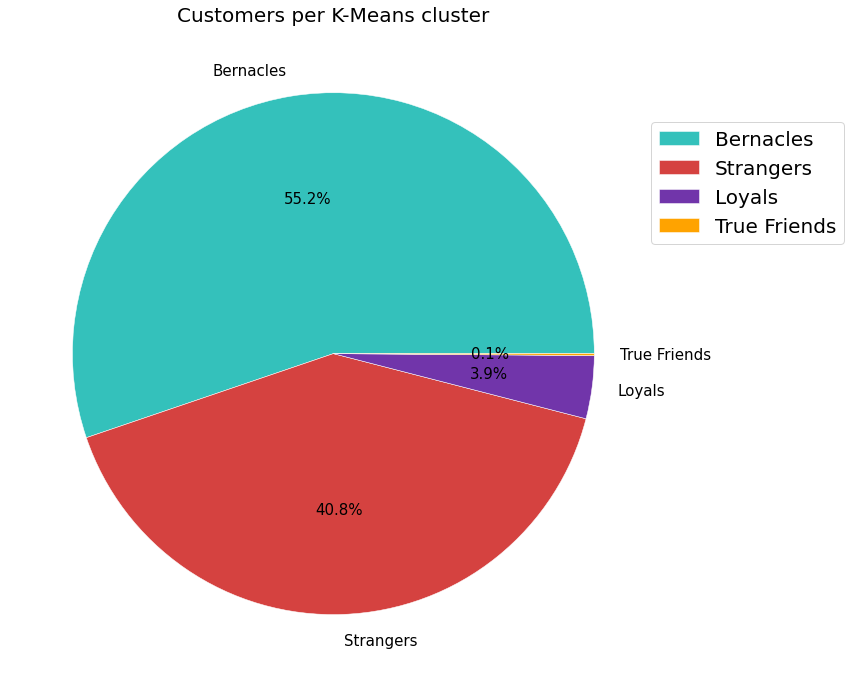

In [24]:
# Plot customers per K-Means cluster
plt.figure(figsize=(20,12))
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'transaction_value': ['mean', 'count']
  }).round(1)['transaction_value', 'count'].plot(kind='pie',autopct='%1.1f%%',labels=labels, ylabel='', 
  wedgeprops={'linewidth': 0.5, 'edgecolor': 'white'},textprops={'color':"black", 'fontsize':15}, colors=colors)
plt.legend(labels, bbox_to_anchor=(0.80,0.7), loc="center", fontsize=20,
           bbox_transform=plt.gcf().transFigure)

plt.title('Customers per K-Means cluster', fontsize=20);

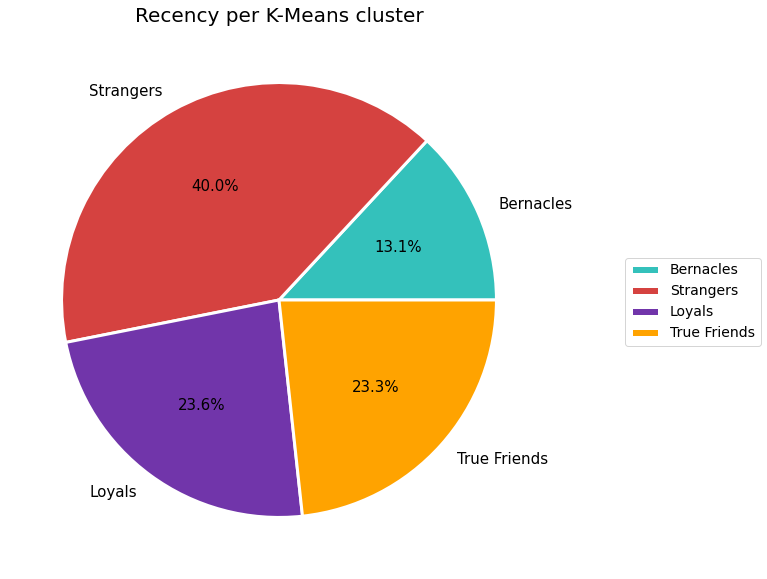

In [25]:
# Plot recency per K-Means cluster
plt.figure(figsize=(20, 10))
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'transaction_value': ['mean', 'count']
  }).round(1)['recency', 'mean'].plot(kind='pie', legend=True, autopct='%1.1f%%',labels=labels, ylabel='', wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},textprops={'color':"black", 'fontsize':15}, colors=colors)

plt.legend(labels, bbox_to_anchor=(0.8,0.5), loc="center", fontsize=14,
           bbox_transform=plt.gcf().transFigure)
plt.title('Recency per K-Means cluster', fontsize=20);

The cluster number are now associated to each customer

In [27]:
df_rfm_4['type_of_client']\
    = df_rfm_4['Cluster'].apply(lambda x: keys_cluster[x])

## Geographic visualization of Clusters

In [28]:
#import the dataset with each city present in the dataset
geo=pd.read_csv("geo.csv", encoding="latin-1")
geo.head()

,geo_city,geo_latitude,geo_longitude,geo_admin1_code,geo_autonomous_community
0,Ibiza - Ibiza,38.90883,1.43296,7,Baleares
1,Calviá - Mallorca,39.56570,2.50621,7,Baleares
2,Pontevedra,42.43100,-8.64435,58,Galicia
3,Gerona,41.98311,2.82493,56,Cataluña
4,Toledo,39.85810,-4.02263,54,Castilla-La Mancha
...,...,...,...,...,...
63,Alcalá de Henares,40.48205,-3.35996,29,Comunidad de Madrid
64,Badajoz,38.87789,-6.97061,57,Extremadura
65,Gijón,43.53573,-5.66152,34,Principado de Asturias
66,Ourense,42.33669,-7.86407,58,Galicia


In [29]:
#transforming the special spanish characters into english characters
geo['geo_city']=geo['geo_city'].str.replace('á','a')
geo['geo_city']=geo['geo_city'].str.replace('é','e')
geo['geo_city']=geo['geo_city'].str.replace('í','i')
geo['geo_city']=geo['geo_city'].str.replace('ó','o')
geo['geo_city']=geo['geo_city'].str.replace('ú','u')
geo['geo_city']=geo['geo_city'].str.replace('ñ','n')
geo['geo_city']=geo['geo_city'].str.replace('Á','A')
geo['geo_city']=geo['geo_city'].str.replace('É','E')
geo['geo_city']=geo['geo_city'].str.replace('Í','I')
geo['geo_city']=geo['geo_city'].str.replace('Ó','O')
geo['geo_city']=geo['geo_city'].str.replace('Ú','U')
geo['geo_city']=geo['geo_city'].str.replace('Ñ','N')



In [31]:
#import the customer dataset
customer=pd.read_csv("20220308_dataset_LUISS_NTT/02.customers.csv", encoding="latin-1")
customer["customer_city"]=customer["customer_city"].str.replace("ñ","n")

In [32]:
#rename geo_city as customer_city to future merging
geo.rename(columns={'geo_city':'customer_city'}, inplace=True)

In [35]:
customer_geo=pd.merge(customer, geo, how="left",on="customer_city")

In [36]:
customer_geo.rename(columns={"customer_unique_id":"customer"}, inplace=True)

In [37]:
#drop second column of a
customer_geo.drop(columns="customer_id", inplace=True)

In [38]:
customer_geo.rename(columns={"customer":"customer_id"}, inplace=True)

In [39]:
df_rfm_5=pd.merge(df_rfm_4,customer_geo, how="left",on="customer_id")

In [40]:
#for each customer_city in df_rmf_5 compute the average cluster value
df_rfm_5['cluster_value']=df_rfm_5.groupby('customer_city')['Cluster'].transform("mean")


To check if the results are correct a list with all the city and their average cluster value is printed

In [42]:
import operator
value_cluster_city=list(zip(df_rfm_5['customer_city'], df_rfm_5['cluster_value']))
value_cluster_city.sort(key=lambda x: x[1], reverse=True)
value_cluster_city

An interactive map showing the average cluster value per city is created 

In [4]:
import plotly.express as px
fig = px.scatter_mapbox(df_rfm_5, lat="geo_latitude", lon="geo_longitude", zoom=4.5, size="cluster_value", color = "cluster_value", size_max=8, hover_name="customer_city", mapbox_style="carto-positron",color_continuous_scale=px.colors.sequential.BuPu)
fig.show()

In [3]:
import pandas as pd
dato=pd.read_csv("data_for_geo.csv")
df_rfm_5=dato.copy()

In [5]:
#export map as html file
import plotly.io as pio
pio.write_html(fig, file="map.html", auto_open=True)

In [44]:
df_rfm_5.to_csv("data_for_geo.csv") #export the dataset to csv